# Project 3. Twitter-Based Crisis Communication Network Analysis
Objective: To analyze how crisis-related information spreads on social media, identify key influencers, and evaluate communication structures during disasters using the CrisisLexT26 dataset.
Dataset: “CrisisLexT26” this dataset contains Twitter messages related to 26 crisis events from 2012–2013. It includes metadata such as tweet content, timestamps, event type, and user information.
Reference paper: https://www.mdpi.com/2076-0760/12/8/436
Download from: https://crisislex.org/data-collections.html
Tools: Python (pandas, NetworkX, matplotlib, NLTK, spaCy), Gephi (optional)

1.
Download the CrisisLexT26 dataset and review its folder structure. Load a few CSV files from multiple events into pandas. Understand the schema: tweet_id, user_id, tweet_text, timestamp, event_type, etc.
2.
Choose one specific event (e.g., Boston Bombings or Alberta Floods). Justify your choice based on data availability and relevance.

In [31]:
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import louvain_communities
import powerlaw
import random 
import numpy as np
import pandas as pd
import re
import spacy
import nltk
from nltk.corpus import stopwords
from nltk.sentiment import SentimentIntensityAnalyzer
from langdetect import detect
import emoji
from itertools import combinations
from collections import defaultdict
from collections import Counter
import csv

In [2]:
df = pd.read_csv('CrisisLexT26-v1.0/CrisisLexT26/2013_Boston_bombings/2013_Boston_bombings-tweets_labeled.csv')

print(df.head)

<bound method NDFrame.head of                Tweet ID                                         Tweet Text  \
0    323808103780990976  RT @VitoCaro7: Good luck to @kyle_piersma toda...   
1    323873597825355778  RT @DianneG: wow. RT @AntDeRosa Photo captures...   
2    323874466063085568  Awful scenes at the #BostonMarathon. The photo...   
3    323874558325161984  Holy shit RT @theoriginalwak: What the fuck ju...   
4    323875384603058176  RT @russian_market: BOMB EXPLOSION IN BOSTON (...   
..                  ...                                                ...   
995  340244410954547200  RT @1510wlac: Boston Strong concert to benefit...   
996  340341051917209601                   Boston bombing suspect 'walking'   
997  340690781352378370  RT @KLSouth: The FBI agents, who eliminated Bo...   
998  343337278111875072  RT @dens: Btw, special thanks to @DICKS for he...   
999  344322373329235969  RT @fancyfenty: he wouldn touch ur lebanese as...   

     Information Source          

3.
Start by loading your dataset of tweets into a pandas DataFrame. To remove non-English tweets, use a language detection library like langdetect or langid, and filter out tweets where the detected language is not English. Next, clean each tweet by removing URLs with regular expressions (e.g., re.sub(r'http\S+', '', text)), strip emojis using a regex or the emoji package, and eliminate duplicates using df.drop_duplicates(). Normalize the text by converting all characters to lowercase (text.lower()). For lemmatization, use the spaCy NLP and replace each word with its lemma using token.lemma_. Then, use the NLTK stopword list (from nltk.corpus import stopwords) to remove common stopwords. Combine these steps into a cleaning function and apply it across the dataset. Store the cleaned version of the tweet in a new column called cleaned_text, and save the updated dataset as a new CSV file for use in the following tasks.

In [3]:
nlp = spacy.load("en_core_web_sm")
nltk.download('stopwords')
stop_words = set(stopwords.words("english"))
def is_english(text):
    try:
        return detect(text) == 'en'
    except:
        return False

def clean_tweet(text):
    # Remove URLs
    text = re.sub(r"http\S+|www\S+", "", text)
    # Remove emojis
    text = emoji.replace_emoji(text, replace="")
    # Lowercase
    text = text.lower()
    # spaCy processing
    doc = nlp(text)
    # Lemmatize and remove stopwords & punctuation
    tokens = [token.lemma_ for token in doc if token.text not in stop_words and not token.is_punct]
    return " ".join(tokens)

# Load dataset
df = df.drop_duplicates()
# Filter English tweets
df['is_english'] = df[' Tweet Text'].apply(is_english)
df = df[df["is_english"] == True]
# Clean tweets
df['cleaned_text'] = df[' Tweet Text'].apply(clean_tweet)
# Save cleaned data
df[['Tweet ID', 'cleaned_text', ' Information Source']].to_csv('cleaned_tweets.csv', index=False)

[nltk_data] Downloading package stopwords to C:\Users\Trin-
[nltk_data]     PC\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


4.
Extract Twitter handles, hashtags, and interaction types (mentions, replies, retweets) using regular expressions (learn more about regular expressions here). Create separate tables: one for user-user interactions and one for hashtag usage.

In [4]:
df['mentions'] = df[' Tweet Text'].apply(lambda x: re.findall(r'@\w+', x))
df['hashtags'] = df[' Tweet Text'].apply(lambda x: re.findall(r'#\w+', x))
df['retweet'] = df[' Tweet Text'].apply(lambda x: x.startswith("RT @"))
df['reply'] = df[' Tweet Text'].apply(lambda x: x.startswith("@"))

interactions = []
for i, row in df.iterrows():
    for mention in row['mentions']:
        interactions.append((row['Tweet ID'], mention, 'mention'))
    if row['retweet']:
        retweeted = ['@' + rt for rt in re.findall(r"RT @(\w+):", row[' Tweet Text'])]
        for rt in retweeted:
            interactions.append((row['Tweet ID'], rt, 'retweet'))

interaction_df = pd.DataFrame(interactions, columns=['source_tweet', 'target_user', 'type'])
interaction_df.to_csv('user_interactions.csv', index = False)

hashtag_usage = df[df['hashtags'].apply(lambda x: len(x) > 0)][['Tweet ID', ' Tweet Text', 'hashtags']]
hashtag_usage.to_csv('hashtag_usage.csv', index = False)

print(interaction_df.head())
print(hashtag_usage.head())

         source_tweet    target_user     type
0  323808103780990976     @VitoCaro7  mention
1  323808103780990976  @kyle_piersma  mention
2  323808103780990976     @VitoCaro7  retweet
3  323873597825355778       @DianneG  mention
4  323873597825355778     @AntDeRosa  mention
             Tweet ID                                         Tweet Text  \
0  323808103780990976  RT @VitoCaro7: Good luck to @kyle_piersma toda...   
2  323874466063085568  Awful scenes at the #BostonMarathon. The photo...   
3  323874558325161984  Holy shit RT @theoriginalwak: What the fuck ju...   
5  323875502056161281  RT @Lana: oh my god... RT @theoriginalwak: Wha...   
8  323876642911031297  #BREAKING @WBZ reporting several people injure...   

            hashtags  
0  [#bostonmarathon]  
2  [#BostonMarathon]  
3  [#bostonmarathon]  
5  [#bostonmarathon]  
8        [#BREAKING]  


5.
Build a directed graph using NetworkX where nodes represent users and edges represent interactions (retweets, mentions, or replies). Each edge should be labeled by interaction type.

6.
Construct an undirected graph where nodes are hashtags and edges represent their co-occurrence within the same tweet. Count the number of co-occurrences as edge weights.

7.
Remove isolated nodes and keep only the largest connected component. Optionally, remove users with very low degree (e.g., degree < 2).

8.
Use matplotlib or Gephi to visualize both graphs (user interaction and hashtag co-occurrence). Use node size to represent degree and color nodes by type (e.g., user, hashtag).

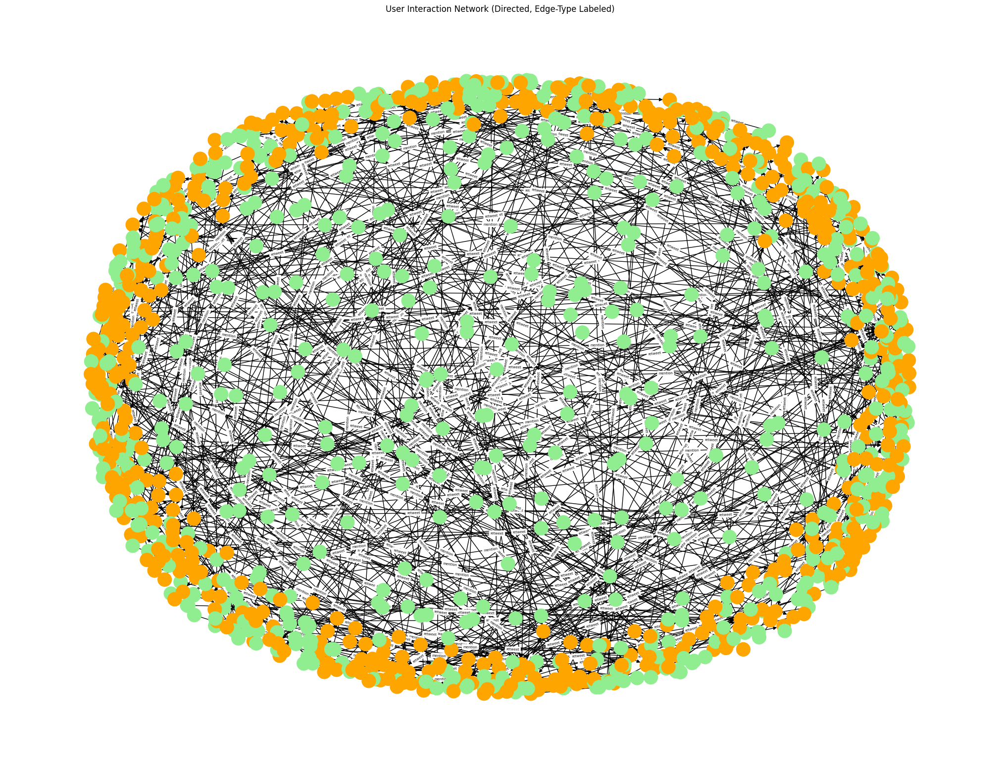

In [5]:
#5
G = nx.DiGraph()

for _, row in interaction_df.iterrows():
    source = str(row['source_tweet'])
    target = row['target_user'].lower()
    interaction_type = row['type']

    G.add_edge(source, target, type=interaction_type)

mention_only = [n for n in G.nodes if G.out_degree(n) == 0 and G.in_degree(n) > 0]

#mention_only is not very meaningful here.
#Users that are part of mention_only only have people retweeting them or mentioning them
#Since user_id column is not present
#The only origin for these users is from RT and mentions
            
node_sizes = [G.degree(n) * 300 for n in G.nodes()]

node_colors = []
for node in G.nodes():
    if node in mention_only:
        node_colors.append('orange')
    elif node.isdigit():
        node_colors.append('lightgreen')
    else:
        node_colors.append('skyblue')

pos = nx.spring_layout(G, k=0.5)
edge_labels = nx.get_edge_attributes(G, 'type')

plt.figure(figsize=(20, 15))
nx.draw(G, pos, with_labels=False, node_color=node_colors, node_size=400, arrows=True)
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=5)
plt.title("User Interaction Network (Directed, Edge-Type Labeled)")
plt.show()

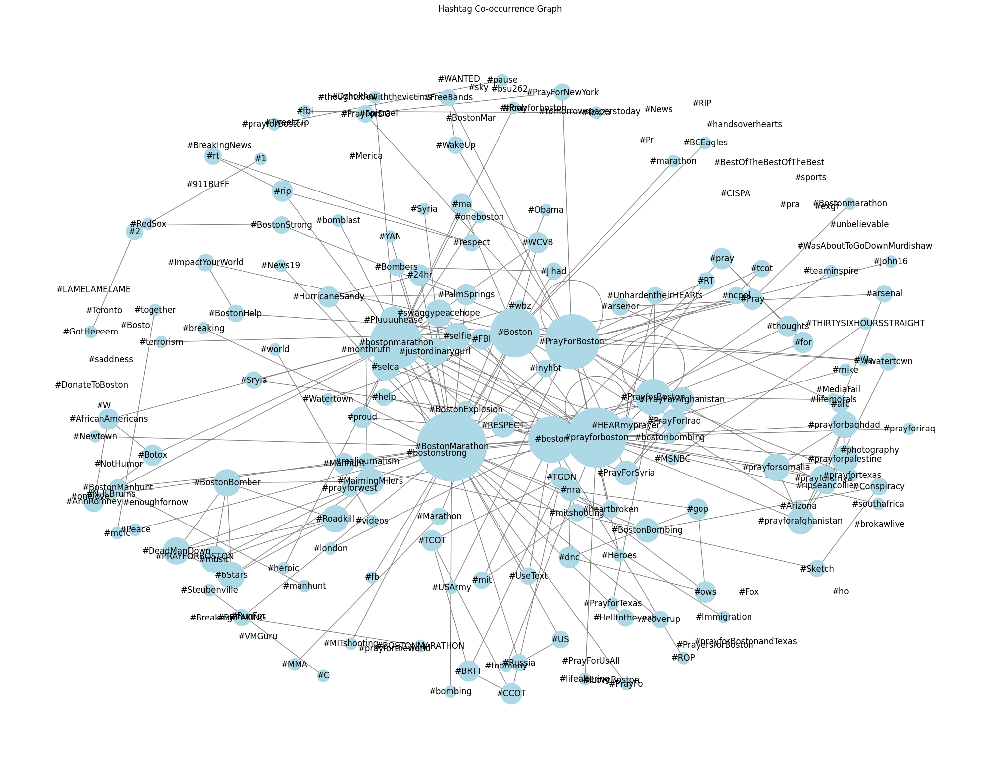

In [6]:
#6
H = nx.Graph()
all_hashtags = set([tag for sublist in df['hashtags'] for tag in sublist])
H.add_nodes_from(all_hashtags)

for hashtags in df['hashtags']:
    if len(hashtags) > 1:
        for pair in combinations(hashtags, 2):
            tag1, tag2 = sorted(pair)
            if H.has_edge(tag1, tag2):
                H[tag1][tag2]['weight'] += 1
            else:
                H.add_edge(tag1, tag2, weight = 1)
                
                
node_sizes = [H.degree(n) * 300 for n in H.nodes()]

pos = nx.spring_layout(H, k=0.5)

plt.figure(figsize=(20, 15))
edges = H.edges()
weights = [H[u][v]['weight'] for u,v in edges]

nx.draw(H, pos, with_labels=True, node_color = 'lightblue', node_size=node_sizes, edge_color = 'grey')
plt.title('Hashtag Co-occurrence Graph')
plt.show()

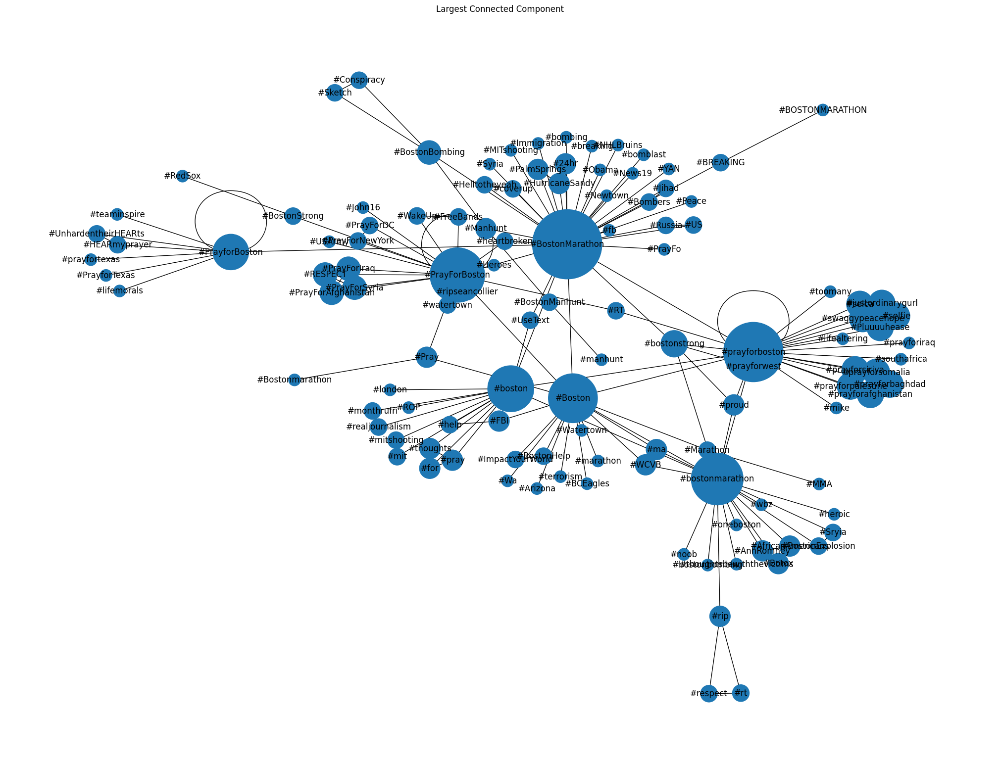

In [7]:
#7
H_connected = H.copy()
H_connected.remove_nodes_from(list(nx.isolates(H)))

largest = max(nx.connected_components(H_connected), key = len)
largest_subgraph = H_connected.subgraph(largest).copy()
node_sizes = [largest_subgraph.degree(n) * 300 for n in largest_subgraph.nodes()]

plt.figure(figsize=(20, 15))
nx.draw(largest_subgraph, node_size=node_sizes, with_labels=True)
plt.title('Largest Connected Component')
plt.show()

9.
Calculate degree, closeness, betweenness, and eigenvector centrality for each user node. Store results in a DataFrame and rank users.

In [8]:
#User Centrality
user_nodes = [node for node in G.nodes()]

degree_centrality = nx.degree_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter = 1000)

centrality_df = pd.DataFrame({
    'User': user_nodes,
    'Degree Centrality': [degree_centrality[node] for node in user_nodes],
    'Closeness Centrality': [closeness_centrality[node] for node in user_nodes],
    'Betweenness Centrality': [betweenness_centrality[node] for node in user_nodes],
    'Eigenvector Centrality': [eigenvector_centrality[node] for node in user_nodes]
})

print(centrality_df.head(10))


                 User  Degree Centrality  Closeness Centrality  \
0  323808103780990976            0.00166               0.00000   
1          @vitocaro7            0.00083               0.00083   
2       @kyle_piersma            0.00083               0.00083   
3  323873597825355778            0.00249               0.00000   
4            @dianneg            0.00083               0.00083   
5          @antderosa            0.00166               0.00166   
6      @boston_to_a_t            0.00083               0.00083   
7  323874558325161984            0.00083               0.00000   
8     @theoriginalwak            0.00249               0.00249   
9  323875502056161281            0.00166               0.00000   

   Betweenness Centrality  Eigenvector Centrality  
0                     0.0                0.000178  
1                     0.0                0.025333  
2                     0.0                0.025333  
3                     0.0                0.000178  
4            

In [34]:
#Hashtag Centrality
hashtag_nodes = [node for node in H_connected.nodes()]

degree_centrality = nx.degree_centrality(H_connected)
closeness_centrality = nx.closeness_centrality(H_connected)
betweenness_centrality = nx.betweenness_centrality(H_connected)
eigenvector_centrality = nx.eigenvector_centrality(H_connected, max_iter = 1000)

hashtag_centrality_df = pd.DataFrame({
    'User': hashtag_nodes,
    'Degree Centrality': [degree_centrality[node] for node in hashtag_nodes],
    'Closeness Centrality': [closeness_centrality[node] for node in hashtag_nodes],
    'Betweenness Centrality': [betweenness_centrality[node] for node in hashtag_nodes],
    'Eigenvector Centrality': [eigenvector_centrality[node] for node in hashtag_nodes]
})

print(hashtag_centrality_df.head(10))
hashtag_centrality_df.to_csv('hashtag_centrality.csv', index = False)

                  User  Degree Centrality  Closeness Centrality  \
0  #PrayForAfghanistan           0.026144              0.235159   
1              #Sketch           0.013072              0.203140   
2              #RedSox           0.006536              0.180211   
3             #UseText           0.013072              0.291688   
4            #thoughts           0.019608              0.239491   
5              #WakeUp           0.013072              0.233950   
6                   #C           0.006536              0.006536   
7                 #ROP           0.006536              0.238237   
8              #lnyhbt           0.013072              0.013072   
9           #Watertown           0.006536              0.252796   

   Betweenness Centrality  Eigenvector Centrality  
0                     0.0            4.316942e-02  
1                     0.0            9.314957e-03  
2                     0.0            3.494883e-03  
3                     0.0            7.829310e-02  
4 

10.
Identify top 10 users based on centrality measures. Cross-reference their user IDs with tweet content to assess their communication tone and roles (e.g., news outlet, public agency).

In [9]:
#Top 10 User Centrality
centrality_measures = ['Degree Centrality', 'Closeness Centrality', 'Betweenness Centrality', 'Eigenvector Centrality']

top_users_per_centrality = {}

for measure in centrality_measures:
    top_users = centrality_df.sort_values(by=measure, ascending=False).head(10)
    top_users_per_centrality[measure] = top_users
    
print(top_users_per_centrality)

df['mentions_str'] = df['mentions'].apply(lambda x: ' '.join(x))

def extract_message(tweet_text, user_handle):
    pattern = re.escape(user_handle) + r'\s*(.*)'
    match = re.search(pattern, tweet_text, re.IGNORECASE)
    if match:
        return match.group(1).strip()
    else:
        return None

extracted_tweets = {}

for measure, df_top in top_users_per_centrality.items():
    user_tweet_map = {}
    for user in df_top['User']:
        user_mentions = df[df['mentions_str'].str.contains(user, case=False)]
        
        messages = user_mentions[' Tweet Text'].apply(lambda x: extract_message(x, user)).dropna().tolist()
        
        user_tweet_map[user] = messages
    extracted_tweets[measure] = user_tweet_map


{'Degree Centrality':                User  Degree Centrality  Closeness Centrality  \
34          @cnnbrk           0.012448              0.012448   
109    @bostonglobe           0.009129              0.009129   
173             @ap           0.006639              0.006639   
798  @boston_police           0.005809              0.005809   
218   @youranonnews           0.004979              0.004979   
20    @bostondotcom           0.004979              0.004979   
427        @_snape_           0.004149              0.004149   
459        @nbcnews           0.004149              0.004149   
683       @buzzfeed           0.004149              0.004149   
139   @buzzfeednews           0.004149              0.004149   

     Betweenness Centrality  Eigenvector Centrality  
34                      0.0                0.377502  
109                     0.0                0.276882  
173                     0.0                0.201417  
798                     0.0                0.176263  
218

In [10]:
all_records = []

for measure, user_map in extracted_tweets.items():
    for user, tweets in user_map.items():
        for tweet in tweets:
            all_records.append({
                'Centrality Measure': measure,
                'User': user,
                'Extracted Tweet': tweet
            })
extracted_tweets_df = pd.DataFrame(all_records)

extracted_tweets_df.to_csv('extracted_tweets.csv', index = False)

In [35]:
#Top 10 Hashtag Centrality
top_hashtag_per_centrality = {}

for measure in centrality_measures:
    top_hashtag = hashtag_centrality_df.sort_values(by=measure, ascending=False).head(10)
    top_hashtag_per_centrality[measure] = top_hashtag
    
print(top_hashtag_per_centrality)

{'Degree Centrality':                   User  Degree Centrality  Closeness Centrality  \
46     #BostonMarathon           0.222222              0.409939   
52      #prayforboston           0.163399              0.371455   
136     #PrayForBoston           0.137255              0.333357   
72     #bostonmarathon           0.124183              0.318205   
59             #Boston           0.111111              0.374512   
20             #boston           0.098039              0.343421   
147     #PrayforBoston           0.058824              0.278307   
120      #BostonBomber           0.032680              0.032680   
133  #prayforpalestine           0.032680              0.254208   
61     #prayforsomalia           0.032680              0.254208   

     Betweenness Centrality  Eigenvector Centrality  
46                 0.354223            3.909418e-01  
52                 0.170724            4.792290e-01  
136                0.148406            1.994775e-01  
72                 0.141

11.
Apply community detection algorithms (e.g., Louvain or Girvan-Newman) to detect user clusters. Visualize communities using unique colors and interpret community roles (e.g., regional groups, media).

Number of Detected Groups : 484


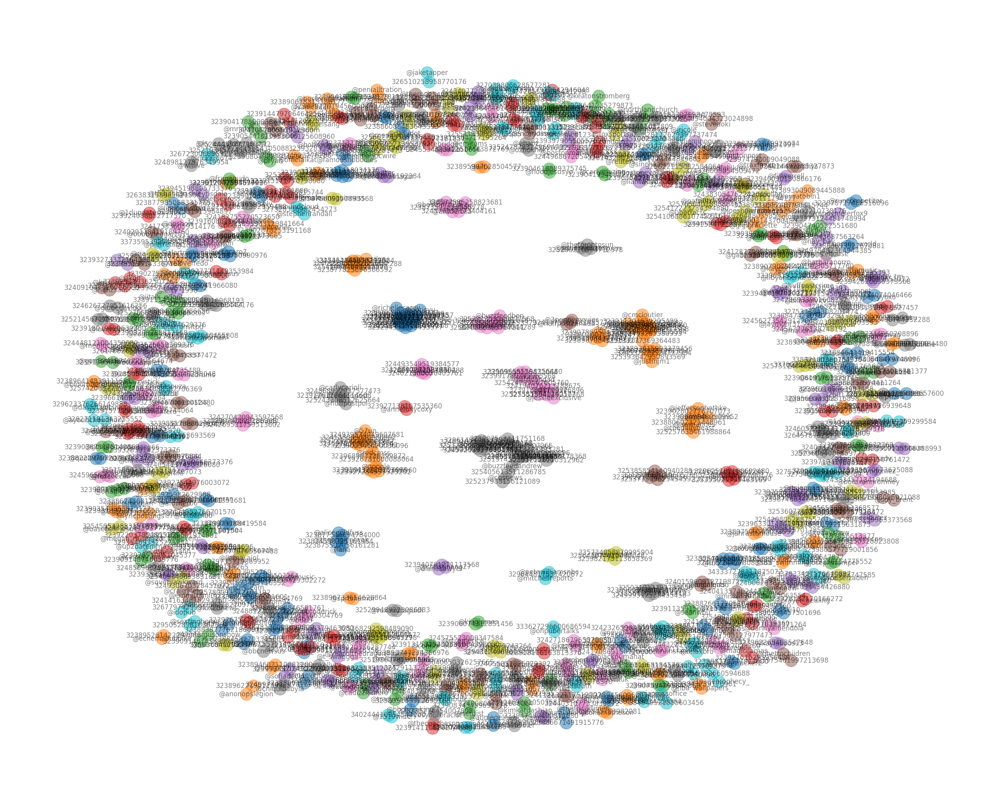

In [21]:
G_undirected = G.to_undirected()
partition = louvain_communities(G_undirected)
partition_groups = [list(group) for group in partition]
print(f'Number of Detected Groups : {len(partition_groups)}')

def plot_graph(node_groups, G):
    num_groups = len(node_groups)
    color_palette = plt.colormaps['tab10'].resampled(num_groups)
    node_color_dict = {}

    for idx, group in enumerate(node_groups):
        for node in group:
            node_color_dict[node] = color_palette(idx)

    color_map = [node_color_dict[node] for node in G.nodes()]

    pos = nx.spring_layout(G, seed=42)    
    plt.figure(figsize=(25, 20))
    nx.draw(G, pos, node_color = color_map, with_labels = True, alpha = 0.5, node_size = 500, font_color = 'black')
    plt.show()
    
plot_graph(partition_groups, G_undirected)

12.
Divide tweets into time windows (e.g., every 6 or 12 hours). Create network snapshots to study how interactions evolve over time. Plot centrality changes and cluster evolution.

In [12]:
df_time = pd.read_csv('2013_Boston_bombings-tweetids_entire_period.csv')
df_time['Timestamp'] = pd.to_datetime(df_time['Timestamp'], format="%a %b %d %H:%M:%S %z %Y", errors='coerce')

df = df.merge(df_time, on='Tweet ID', how='left')
df.to_csv('cleaned_with_timestamp.csv', index = False)

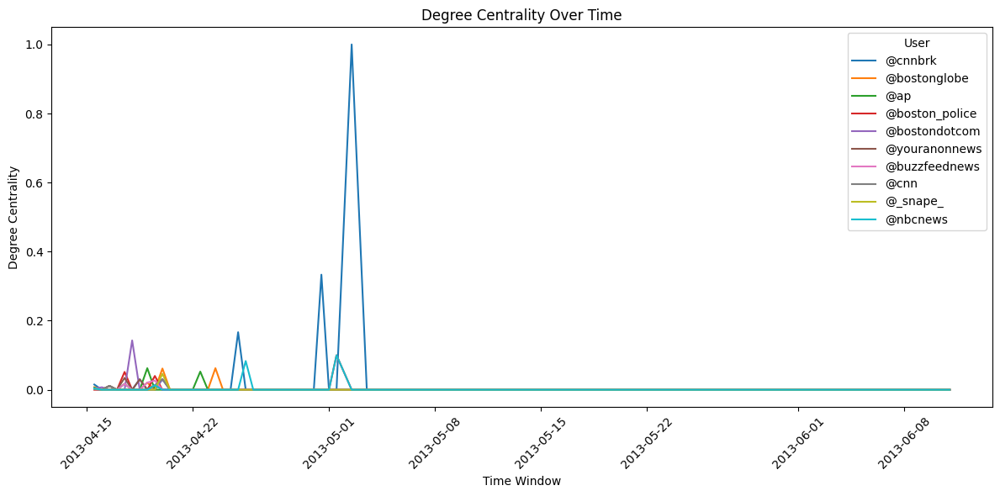

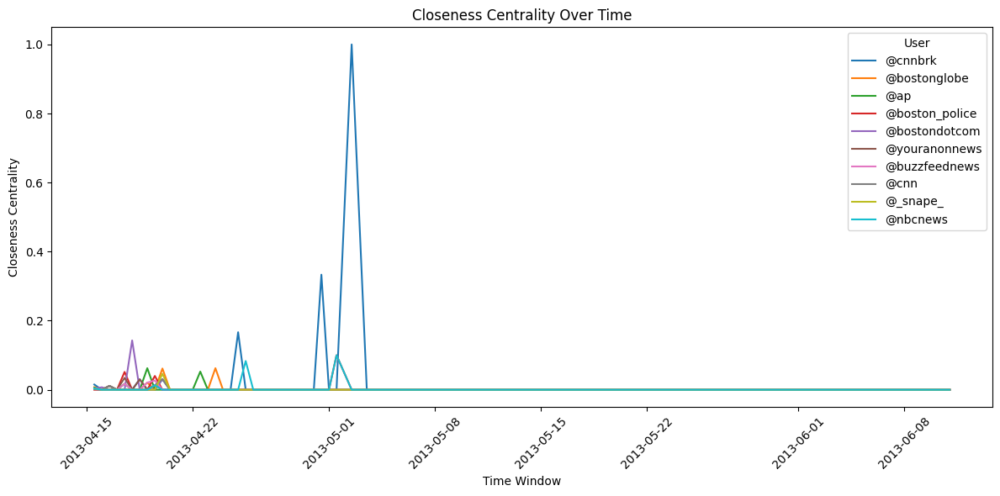

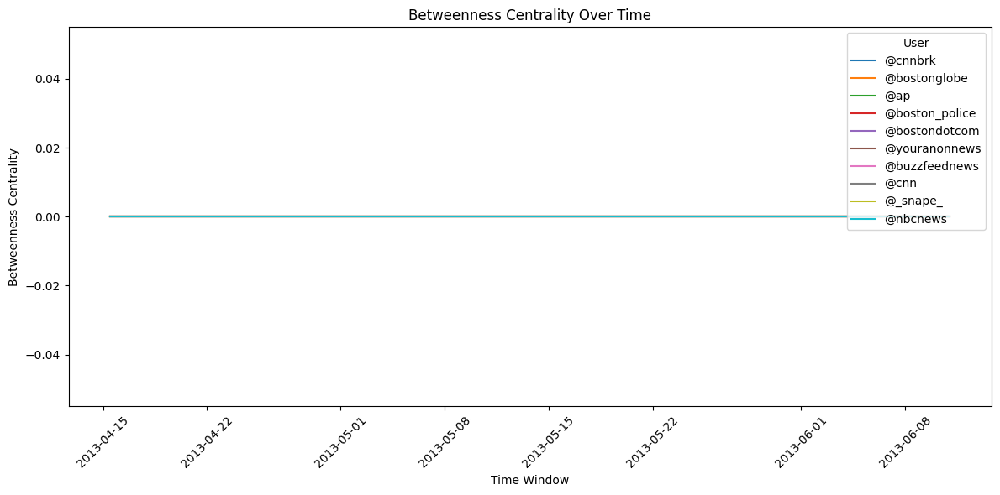

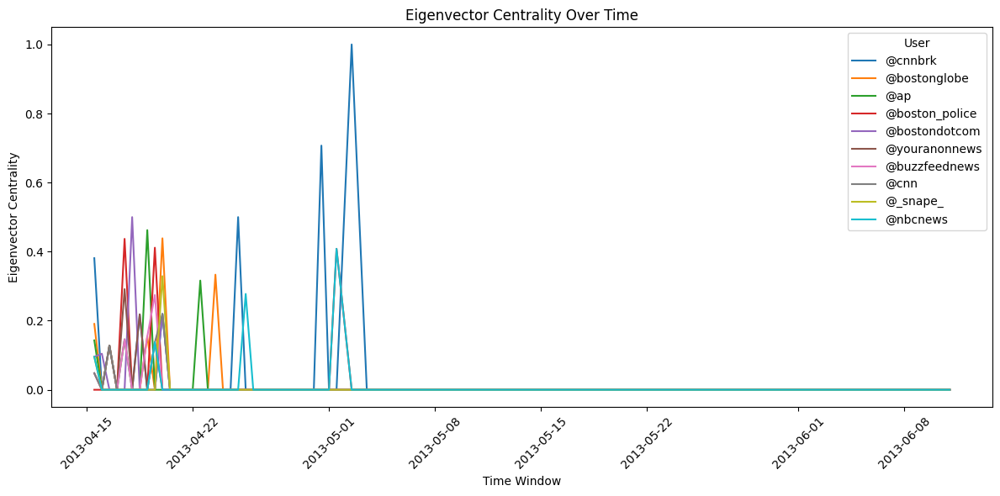

In [13]:
df = df.sort_values(by='Timestamp')
df['time_bin'] = df['Timestamp'].dt.floor('12h')

interaction_df = interaction_df.merge(df[['Tweet ID', 'time_bin']], left_on='source_tweet', right_on='Tweet ID', how='left')

time_bins = interaction_df['time_bin'].dropna().unique()
graphs_by_time = {}

for time in time_bins:
    df_bin = interaction_df[interaction_df['time_bin'] == time]
    I = nx.DiGraph()

    for _, row in df_bin.iterrows():
        sender = str(row['source_tweet'])
        receiver = row['target_user'].lower()
        interaction = row['type']
        I.add_edge(sender, receiver, interaction=interaction)

    graphs_by_time[time] = I
    
combined_I = nx.compose_all(list(graphs_by_time.values()))
overall_centrality = nx.degree_centrality(combined_I)
top_users = sorted(overall_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_users = [u for u, _ in top_users]

centrality_over_time = {
    'Degree': defaultdict(list),
    'Closeness': defaultdict(list),
    'Betweenness': defaultdict(list),
    'Eigenvector': defaultdict(list)
}

for time, I in graphs_by_time.items():
    if I.number_of_nodes() == 0:
        continue

    deg = nx.degree_centrality(I)
    clo = nx.closeness_centrality(I)
    bet = nx.betweenness_centrality(I)
    try:
        eig = nx.eigenvector_centrality(I, max_iter=1000)
    except nx.PowerIterationFailedConvergence:
        eig = {n: 0 for n in G.nodes()}  # fallback

    for user in top_users:
        centrality_over_time['Degree'][user].append((time, deg.get(user, 0)))
        centrality_over_time['Closeness'][user].append((time, clo.get(user, 0)))
        centrality_over_time['Betweenness'][user].append((time, bet.get(user, 0)))
        centrality_over_time['Eigenvector'][user].append((time, eig.get(user, 0)))

        
for centrality_type in centrality_over_time:
    plt.figure(figsize=(12, 6))
    for user, values in centrality_over_time[centrality_type].items():
        times, scores = zip(*sorted(values))
        plt.plot(times, scores, label=user)
    plt.title(f"{centrality_type} Centrality Over Time")
    plt.xlabel("Time Window")
    plt.ylabel(f"{centrality_type} Centrality")
    plt.legend(title='User')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [14]:
print(interaction_df.head())

         source_tweet    target_user     type            Tweet ID  \
0  323808103780990976     @VitoCaro7  mention  323808103780990976   
1  323808103780990976  @kyle_piersma  mention  323808103780990976   
2  323808103780990976     @VitoCaro7  retweet  323808103780990976   
3  323873597825355778       @DianneG  mention  323873597825355778   
4  323873597825355778     @AntDeRosa  mention  323873597825355778   

                   time_bin  
0 2013-04-15 12:00:00+00:00  
1 2013-04-15 12:00:00+00:00  
2 2013-04-15 12:00:00+00:00  
3 2013-04-15 12:00:00+00:00  
4 2013-04-15 12:00:00+00:00  


13.
Use VADER to analyze the sentiment of each tweet. Assign an average sentiment score to each user node and visualize this on the user network.

[nltk_data] Downloading package vader_lexicon to C:\Users\Trin-
[nltk_data]     PC\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


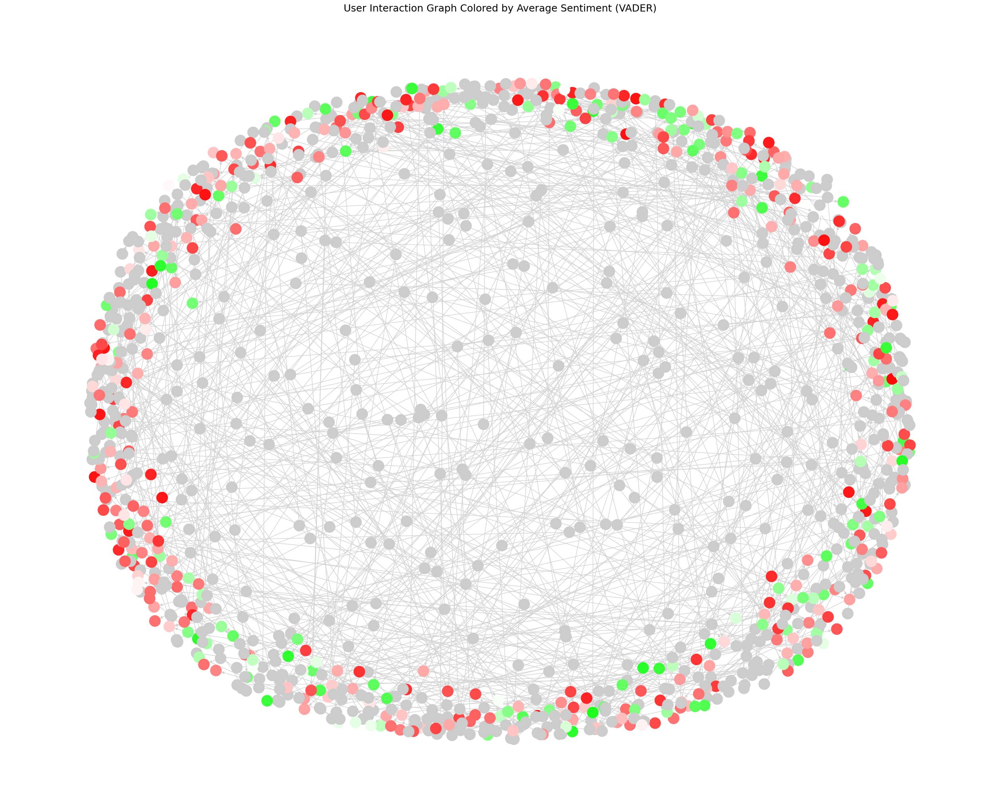

In [26]:
nltk.download('vader_lexicon')
sia = SentimentIntensityAnalyzer()
df['sentiment'] = df[' Tweet Text'].apply(lambda text: sia.polarity_scores(str(text))['compound'])
user_sentiment_scores = defaultdict(list)

for _, row in df.iterrows():
    for mention in row['mentions']:
        user_sentiment_scores[mention.lower()].append(row['sentiment'])

avg_user_sentiment = {user: sum(scores) / len(scores) for user, scores in user_sentiment_scores.items()}

node_colors = []
for node in G.nodes():
    if node in avg_user_sentiment:
        score = avg_user_sentiment[node]
        if score > 0:
            node_colors.append((1 - score, 1, 1 - score))
        elif score < 0:
            node_colors.append((1, 1 + score, 1 + score))
        else:
            node_colors.append((0.8, 0.8, 0.8))
    else:
        node_colors.append((0.8, 0.8, 0.8))

# Draw graph
pos = nx.spring_layout(G, k=0.5)
plt.figure(figsize=(25, 20))

nx.draw(G, pos, with_labels=False, node_color=node_colors, node_size=400, arrows=True, edge_color='lightgray')

plt.title('User Interaction Graph Colored by Average Sentiment (VADER)', fontsize=18)
plt.show()

14.
Identify trending hashtags and topics within the crisis period using frequency and co-occurrence metrics. Compare these across time windows or community clusters.

Top hashtags from April 15–20: ['#prayforboston', '#BostonMarathon', '#PrayForBoston', '#Boston', '#bostonmarathon', '#PrayforBoston', '#boston', '#BREAKING', '#wbz', '#Bostonmarathon']


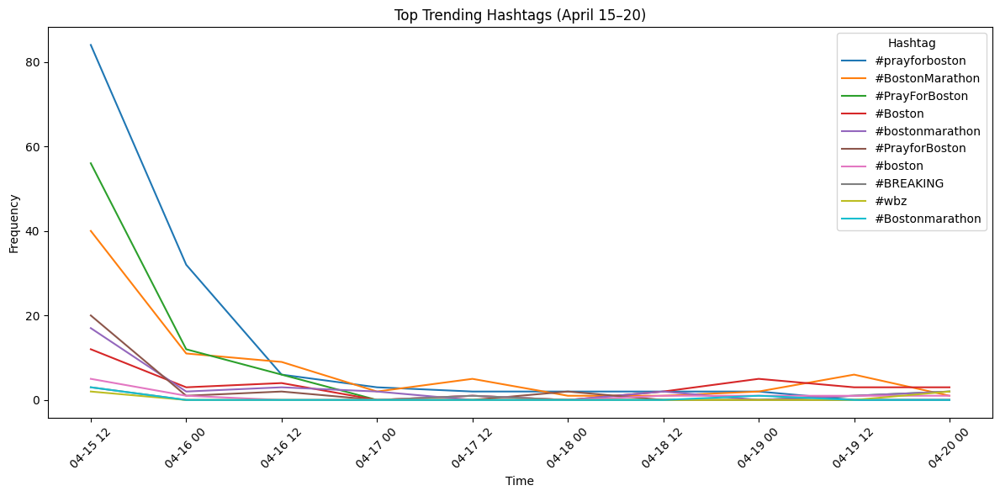

In [16]:
df['time_bin'] = df['Timestamp'].dt.floor('12h')  # lowercase 'h' avoids deprecation warning

hashtag_freq_by_time = defaultdict(Counter)

for time, group in df.groupby('time_bin'):
    for hashtags in group['hashtags']:
        hashtag_freq_by_time[time].update(hashtags)

tz = df['time_bin'].iloc[0].tz
start_date = pd.Timestamp("2013-04-15", tz=tz)
end_date = pd.Timestamp("2013-04-20", tz=tz)

filtered_bins = [t for t in sorted(hashtag_freq_by_time.keys()) if start_date <= t <= end_date]

filtered_counts = Counter()
for t in filtered_bins:
    filtered_counts.update(hashtag_freq_by_time[t])

top_tags = [tag for tag, _ in filtered_counts.most_common(10)]
print("Top hashtags from April 15–20:", top_tags)

tag_trends = {tag: [] for tag in top_tags}

for t in filtered_bins:
    counter = hashtag_freq_by_time[t]
    for tag in top_tags:
        tag_trends[tag].append(counter.get(tag, 0))

plt.figure(figsize=(12, 6))
for tag, counts in tag_trends.items():
    plt.plot(filtered_bins, counts, label=tag)

plt.title("Top Trending Hashtags (April 15–20)")
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.xticks(rotation=45)
plt.legend(title="Hashtag")
plt.tight_layout()
plt.show()

15.
Compile a comprehensive report including all major findings key influencers, temporal patterns, network structure, community dynamics, and sentiment trends. Discuss implications for emergency communication design and early warning strategies.

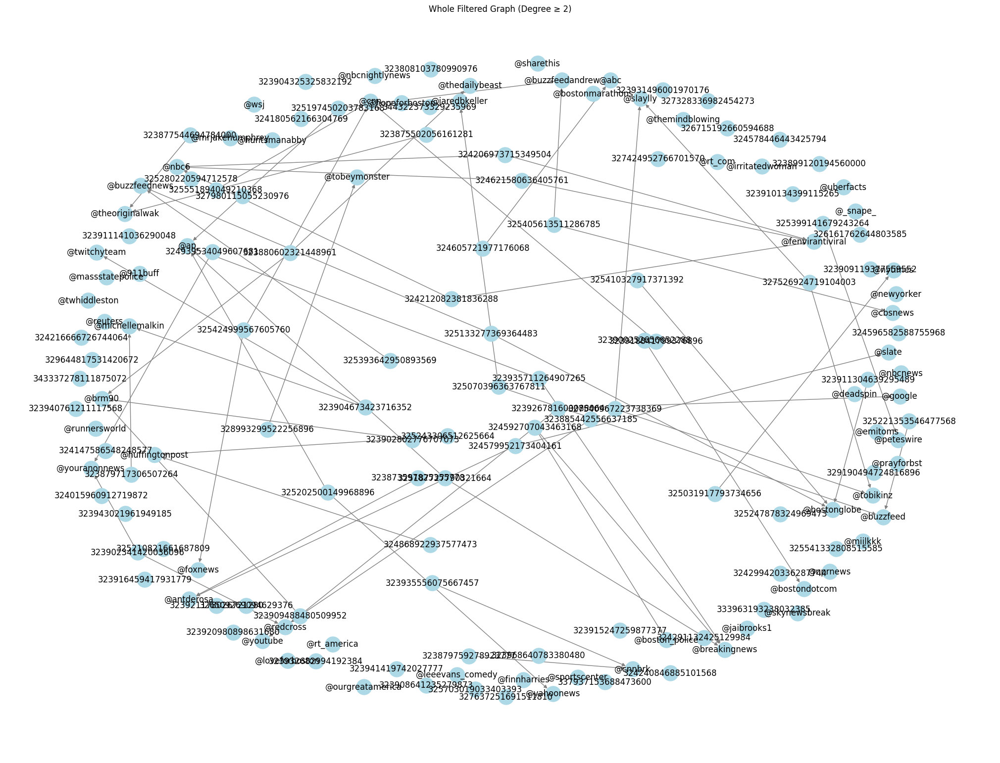

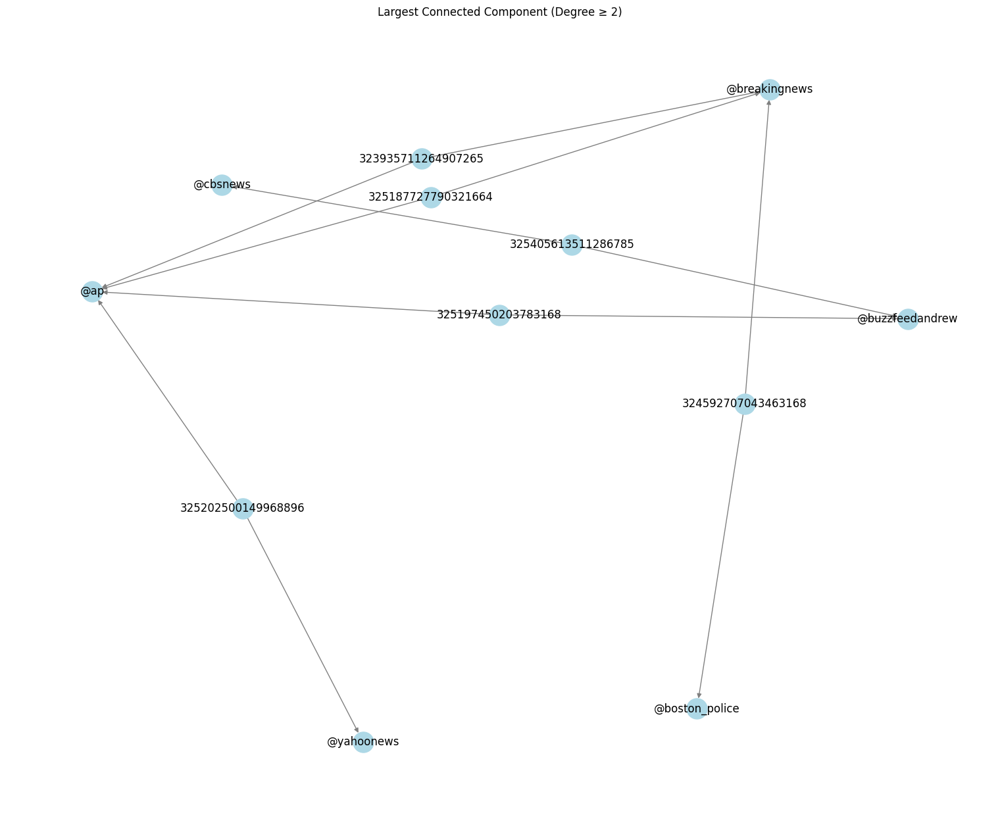

In [25]:
G_filtered = G.copy()

low_degree_nodes = [n for n in G_filtered.nodes if G_filtered.degree(n) < 2]
G_filtered.remove_nodes_from(low_degree_nodes)

largest_cc_nodes = max(nx.connected_components(G_filtered.to_undirected()), key=len)
largest_cc = G_filtered.subgraph(largest_cc_nodes).copy()

pos = nx.spring_layout(G_filtered, k=0.5, seed=42)
plt.figure(figsize=(20, 15))
nx.draw(G_filtered, pos, with_labels=True, node_color='lightblue', node_size=500, edge_color='gray')
plt.title("Whole Filtered Graph (Degree ≥ 2)")

pos = nx.spring_layout(largest_cc, k=0.5, seed=42)
plt.figure(figsize=(15, 12))
nx.draw(largest_cc, pos, with_labels=True, node_color='lightblue', node_size=500, edge_color='gray')
plt.title("Largest Connected Component (Degree ≥ 2)")
plt.show()
